In [5]:
import pandas as pd
import numpy as np

In [52]:
df_in = pd.read_csv('data/inbound_tourism.csv', sep=';', thousands='.', decimal=',')

In [53]:
df_in.columns

Index(['Basic data and indicators', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Units', 'Notes', 'Series', '1995', '1996', '1997',
       '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40'],
      dtype='object')

In [54]:
col_year = ['1995', '1996', '1997',
       '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021']

In [59]:
for i in col_year:
    df_in[i] = df_in[i].astype(str).str.replace('.', '')


/var/folders/lq/66qmb5qs6yx8s8h1s8rmqnh80000gn/T/ipykernel_13522/2246560997.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_in[i] = df_in[i].astype(str).str.replace('.', '')


In [60]:
df_in['Unnamed: 3']
df_in['Unnamed: 3'] = df_in['Unnamed: 3'].fillna(df_in['Unnamed: 2'])

In [61]:
df_in['Unnamed: 3'] = df_in['Unnamed: 3'].fillna(df_in['Unnamed: 4'])
df_in['Unnamed: 3'].head(10)

2                        Total arrivals
3        Overnights visitors (tourists)
4     Same-day visitors (excursionists)
5           of which, cruise passengers
7                                 Total
8                                Africa
9                              Americas
10            East Asia and the Pacific
11                               Europe
12                          Middle East
Name: Unnamed: 3, dtype: object

In [62]:
df_in['Basic data and indicators'] = df_in['Basic data and indicators'].fillna(method='ffill')
df_in['Unnamed: 1'] = df_in['Unnamed: 1'].fillna(method='ffill')
df_in.head()

,Basic data and indicators,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Units,Notes,Series,1995,1996,...,2018,2019,2020,2021,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
2,AFGHANISTAN,Arrivals,Total arrivals,Total arrivals,NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
3,AFGHANISTAN,Arrivals,NaN,Overnights visitors (tourists),NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
4,AFGHANISTAN,Arrivals,NaN,Same-day visitors (excursionists),NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
5,AFGHANISTAN,Arrivals,NaN,"of which, cruise passengers","of which, cruise passengers",Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
7,AFGHANISTAN,Arrivals by region,Total,Total,NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
row_drop = df_in[df_in['Unnamed: 3'].isna()].index
df_in.drop(row_drop, inplace = True)

df_in.head()

,Basic data and indicators,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Units,Notes,Series,1995,1996,...,2018,2019,2020,2021,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
2,AFGHANISTAN,Arrivals,Total arrivals,Total arrivals,NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
3,AFGHANISTAN,Arrivals,NaN,Overnights visitors (tourists),NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
4,AFGHANISTAN,Arrivals,NaN,Same-day visitors (excursionists),NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
5,AFGHANISTAN,Arrivals,NaN,"of which, cruise passengers","of which, cruise passengers",Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN
7,AFGHANISTAN,Arrivals by region,Total,Total,NaN,Thousands,NaN,NaN,,,...,,,,,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
df_in.drop(['Unnamed: 2', 'Unnamed: 4', 'Notes', 'Series', 'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38',	'Unnamed: 39',	'Unnamed: 40'], axis=1, inplace = True)

In [65]:
df_in.rename(columns=lambda x : x.lower(), inplace=True)
df_in.rename(columns=lambda x : x.replace(' ', '_'), inplace=True)
df_in.columns

Index(['basic_data_and_indicators', 'unnamed:_1', 'unnamed:_3', 'units',
       '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003',
       '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012',
       '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021'],
      dtype='object')

In [66]:
df_in = df_in.rename(columns={'basic_data_and_indicators':'iso3', 'unnamed:_1':'category', 'unnamed:_3': 'ind'})

In [67]:
df_in.columns

Index(['iso3', 'category', 'ind', 'units', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', '2018', '2019', '2020', '2021'],
      dtype='object')

In [68]:
col_to_keep = ['iso3', 
               'category', 
               'ind', 
               'units', 
                '2012', 
                '2013', 
                '2014', 
                '2015',
                '2016', 
                '2017', 
                '2018', 
                '2019', 
                '2020', 
                '2021'
]

In [69]:
df_in = df_in.loc[:,col_to_keep]

In [70]:
df_in.columns

Index(['iso3', 'category', 'ind', 'units', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021'],
      dtype='object')

In [72]:
df_in.head()

,iso3,category,ind,units,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
2,AFGHANISTAN,Arrivals,Total arrivals,Thousands,,,,,,,,,,
3,AFGHANISTAN,Arrivals,Overnights visitors (tourists),Thousands,,,,,,,,,,
4,AFGHANISTAN,Arrivals,Same-day visitors (excursionists),Thousands,,,,,,,,,,
5,AFGHANISTAN,Arrivals,"of which, cruise passengers",Thousands,,,,,,,,,,
7,AFGHANISTAN,Arrivals by region,Total,Thousands,,,,,,,,,,


In [74]:
col_year = ['2012', 
            '2013', 
            '2014', 
            '2015',
            '2016', 
            '2017', 
            '2018', 
            '2019', 
            '2020', 
            '2021']

In [75]:
sel_category = ['Arrivals by region']

In [76]:
arrivel_region = df_in[df_in['category'].isin(sel_category)]


In [77]:
arrivel_region[arrivel_region['iso3'] == 'GERMANY'].head()

,iso3,category,ind,units,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
2632,GERMANY,Arrivals by region,Total,Thousands,30411,31545,32999,34970,35555,37452,38881,39563,12449,11688
2633,GERMANY,Arrivals by region,Africa,Thousands,227,246,254,274,263,271,273,284,74,62
2634,GERMANY,Arrivals by region,Americas,Thousands,3155,3192,3272,3487,3509,3890,4085,4142,797,874
2635,GERMANY,Arrivals by region,East Asia and the Pacific,Thousands,2666,2805,3024,3556,3489,3889,3965,3963,579,314
2636,GERMANY,Arrivals by region,Europe,Thousands,23121,23899,24915,25951,26568,27635,28681,29489,10595,10048


In [78]:
arrivel_region.drop(columns='category', axis=1, inplace=True)

/var/folders/lq/66qmb5qs6yx8s8h1s8rmqnh80000gn/T/ipykernel_13522/344891017.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arrivel_region.drop(columns='category', axis=1, inplace=True)


In [79]:
arrivel_region

,iso3,ind,units,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
7,AFGHANISTAN,Total,Thousands,,,,,,,,,,
8,AFGHANISTAN,Africa,Thousands,,,,,,,,,,
9,AFGHANISTAN,Americas,Thousands,,,,,,,,,,
10,AFGHANISTAN,East Asia and the Pacific,Thousands,,,,,,,,,,
11,AFGHANISTAN,Europe,Thousands,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7781,ZIMBABWE,Europe,Thousands,114,131,144,153,141,223,237,191,37,71
7782,ZIMBABWE,Middle East,Thousands,1,1,2,1,1,3,2,4,"0,3","0,3"
7783,ZIMBABWE,South Asia,Thousands,2,3,2,7,5,9,14,13,3,3
7784,ZIMBABWE,Other not classified,Thousands,,,,,,,,,,


In [80]:
arrivel_region.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2007 entries, 7 to 7785
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   iso3    2007 non-null   object
 1   ind     2007 non-null   object
 2   units   2007 non-null   object
 3   2012    2007 non-null   object
 4   2013    2007 non-null   object
 5   2014    2007 non-null   object
 6   2015    2007 non-null   object
 7   2016    2007 non-null   object
 8   2017    2007 non-null   object
 9   2018    2007 non-null   object
 10  2019    2007 non-null   object
 11  2020    2007 non-null   object
 12  2021    2007 non-null   object
dtypes: object(13)
memory usage: 219.5+ KB


In [81]:
col_num = ['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']

for i in col_num:
    #arrivel_region[i] = pd.to_numeric(arrivel_region[i], downcast='integer',  errors='coerce')
    arrivel_region[i] = pd.to_numeric(arrivel_region[i], errors='coerce')

/var/folders/lq/66qmb5qs6yx8s8h1s8rmqnh80000gn/T/ipykernel_13522/3530718804.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arrivel_region[i] = pd.to_numeric(arrivel_region[i], errors='coerce')


In [82]:
arrivel_region.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2007 entries, 7 to 7785
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   iso3    2007 non-null   object 
 1   ind     2007 non-null   object 
 2   units   2007 non-null   object 
 3   2012    1167 non-null   float64
 4   2013    1178 non-null   float64
 5   2014    1169 non-null   float64
 6   2015    1186 non-null   float64
 7   2016    1187 non-null   float64
 8   2017    1180 non-null   float64
 9   2018    1165 non-null   float64
 10  2019    1150 non-null   float64
 11  2020    1081 non-null   float64
 12  2021    956 non-null    float64
dtypes: float64(10), object(3)
memory usage: 219.5+ KB


In [83]:
from transform_esg import melt_pivot

In [84]:
arrivel_region_trans = melt_pivot(arrivel_region)

In [85]:
arrivel_region_trans.rename(columns=lambda x : x.lower(), inplace=True)
arrivel_region_trans.rename(columns=lambda x : x.replace(' ', '_'), inplace=True)
arrivel_region_trans.rename({'variable':'year'}, axis=1, inplace=True)
arrivel_region_trans.columns

Index(['iso3', 'year', 'africa', 'americas', 'east_asia_and_the_pacific',
       'europe', 'middle_east', 'other_not_classified', 'south_asia', 'total',
       'of_which,_nationals_residing_abroad'],
      dtype='object', name='ind')

In [86]:
arrivel_region_trans.head()

ind,iso3,year,africa,americas,east_asia_and_the_pacific,europe,middle_east,other_not_classified,south_asia,total,"of_which,_nationals_residing_abroad"
0,AFGHANISTAN,2012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFGHANISTAN,2013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFGHANISTAN,2014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AFGHANISTAN,2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AFGHANISTAN,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
arrivel_region_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2230 entries, 0 to 2229
Data columns (total 11 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   iso3                                 2230 non-null   object 
 1   year                                 2230 non-null   object 
 2   africa                               1261 non-null   float64
 3   americas                             1751 non-null   float64
 4   east_asia_and_the_pacific            1555 non-null   float64
 5   europe                               1765 non-null   float64
 6   middle_east                          979 non-null    float64
 7   other_not_classified                 1032 non-null   float64
 8   south_asia                           1047 non-null   float64
 9   total                                1780 non-null   float64
 10  of_which,_nationals_residing_abroad  249 non-null    float64
dtypes: float64(9), object(2)
memor

In [88]:
from country_iso_dict import country_iso_dict

In [89]:
country_iso_dict = {key.upper(): value for key, value in country_iso_dict.items()}

In [90]:
arrivel_region_trans['iso3'] = arrivel_region_trans['iso3'].map(country_iso_dict)

In [91]:
arrivel_region_trans['iso3']

0       AFG
1       AFG
2       AFG
3       AFG
4       AFG
       ... 
2225    ZWE
2226    ZWE
2227    ZWE
2228    ZWE
2229    ZWE
Name: iso3, Length: 2230, dtype: object

In [92]:
arrivel_region_trans['iso3'].nunique()

199

In [93]:
arrivel_region_trans.isna().sum()

ind
iso3                                    240
year                                      0
africa                                  969
americas                                479
east_asia_and_the_pacific               675
europe                                  465
middle_east                            1251
other_not_classified                   1198
south_asia                             1183
total                                   450
of_which,_nationals_residing_abroad    1981
dtype: int64

In [94]:
arrivel_region_trans = arrivel_region_trans.dropna(subset=['iso3'])

In [95]:
arrivel_region_trans.isna().sum()

ind
iso3                                      0
year                                      0
africa                                  856
americas                                378
east_asia_and_the_pacific               564
europe                                  375
middle_east                            1111
other_not_classified                   1035
south_asia                             1045
total                                   361
of_which,_nationals_residing_abroad    1771
dtype: int64

In [96]:
arrivel_region_trans['iso3'].nunique()

199

In [97]:
arrivel_region_trans[arrivel_region_trans['iso3'] == 'ZAF']

ind,iso3,year,africa,americas,east_asia_and_the_pacific,europe,middle_east,other_not_classified,south_asia,total,"of_which,_nationals_residing_abroad"
1860,ZAF,2012,6648.0,514.0,401.0,1434.0,23.0,26.0,142.0,9188.0,NaN
1861,ZAF,2013,6847.0,546.0,437.0,1517.0,26.0,20.0,145.0,9537.0,NaN
1862,ZAF,2014,7272.0,435.0,293.0,1400.0,24.0,15.0,110.0,9549.0,NaN
1863,ZAF,2015,6738.0,404.0,270.0,1351.0,25.0,14.0,102.0,8904.0,NaN
1864,ZAF,2016,7492.0,474.0,338.0,1570.0,33.0,12.0,126.0,10044.0,NaN
1865,ZAF,2017,7550.0,546.0,328.0,1688.0,34.0,13.0,128.0,10285.0,NaN
1866,ZAF,2018,7778.0,561.0,324.0,1646.0,29.0,14.0,121.0,10472.0,NaN
1867,ZAF,2019,7592.0,561.0,320.0,1586.0,34.0,16.0,121.0,10229.0,NaN
1868,ZAF,2020,2135.0,120.0,55.0,453.0,9.0,4.0,27.0,2802.0,NaN
1869,ZAF,2021,1871.0,99.0,20.0,221.0,12.0,4.0,28.0,2256.0,NaN


In [98]:
import matplotlib.pyplot as plt

In [99]:
country_lst = arrivel_region_trans['iso3'].unique().tolist()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


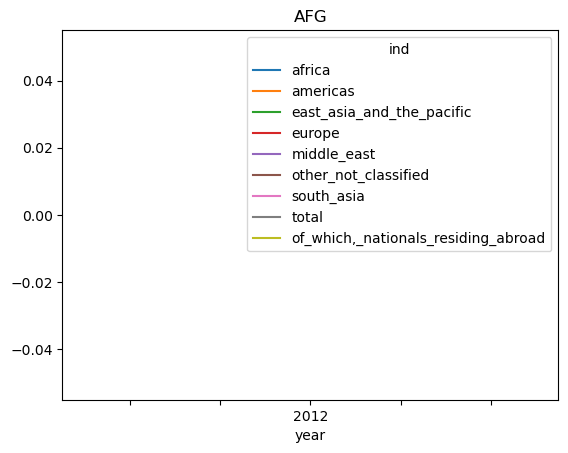

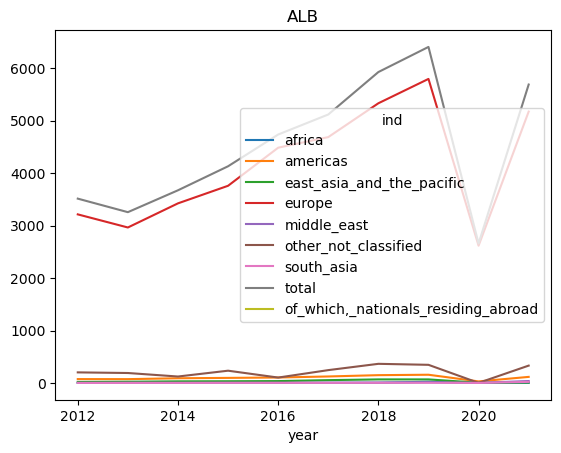

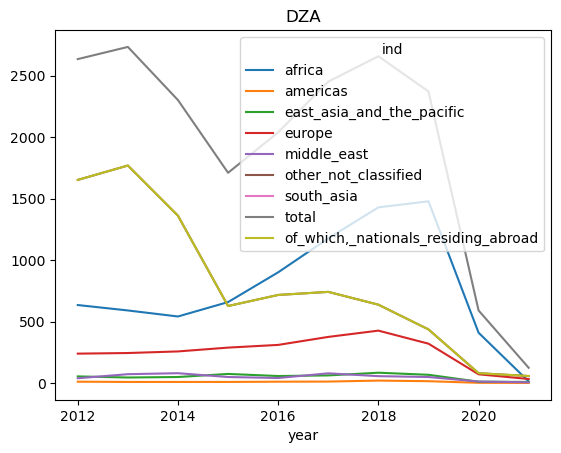

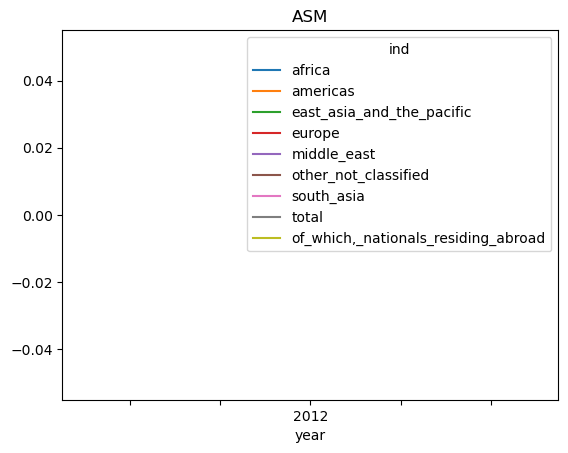

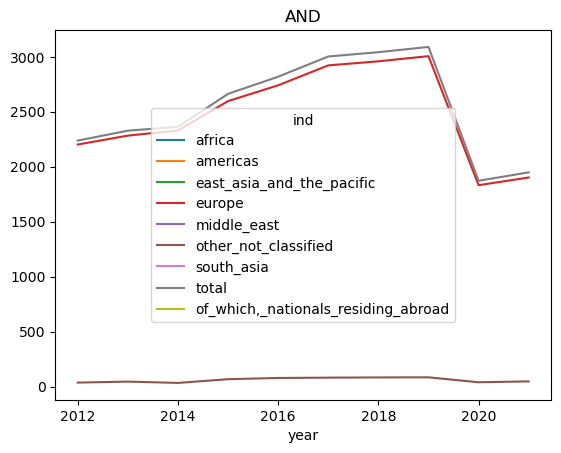

...

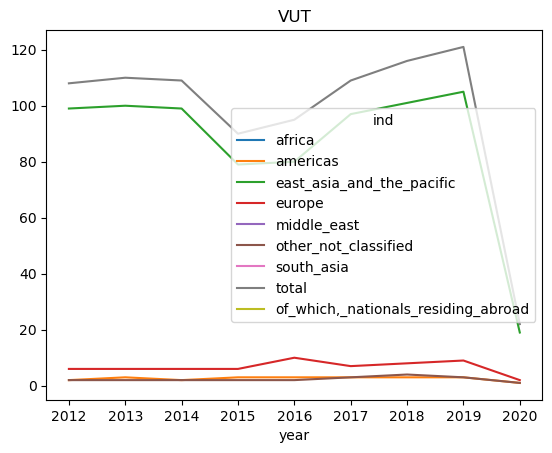

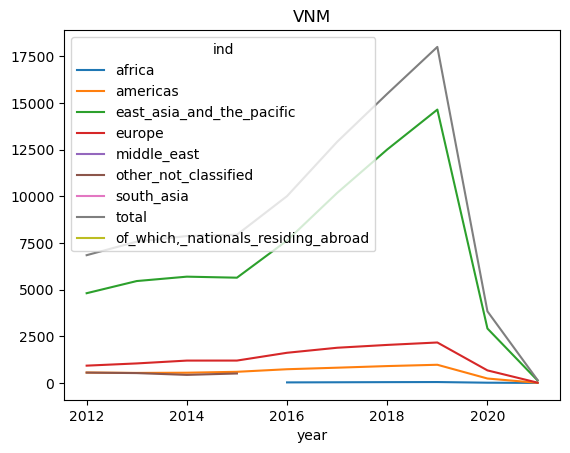

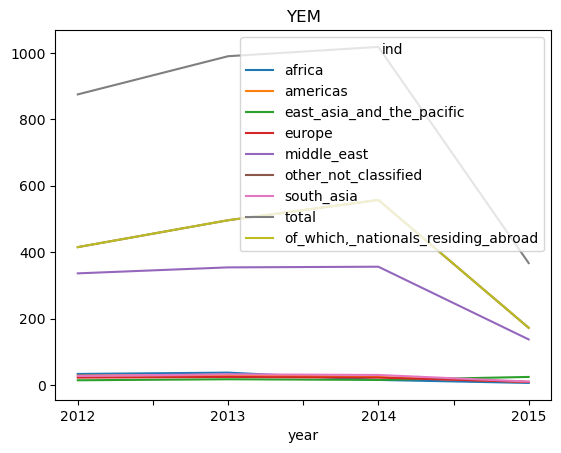

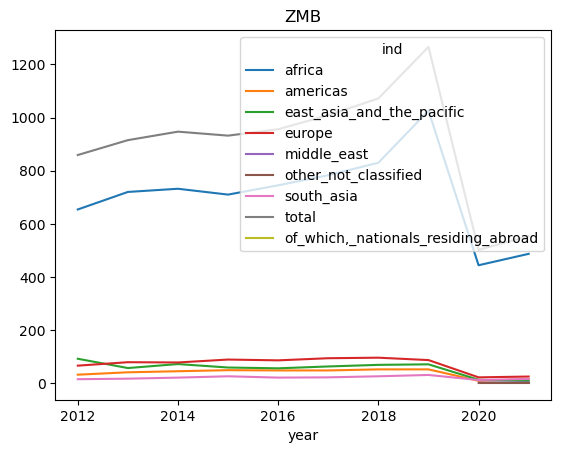

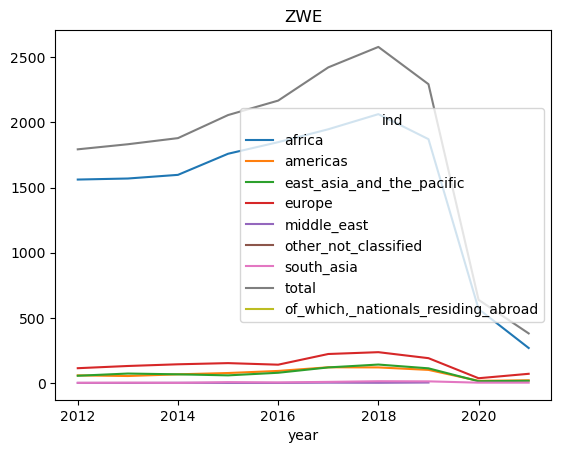

In [50]:
for i in country_lst:
    arrivel_region_trans[arrivel_region_trans['iso3'] == i].plot(x='year')
    plt.title(f"{i}")
    

In [100]:
arrivel_region_trans.to_csv('data/arrival_regions.csv')

In [101]:
from sql_functions import get_engine

In [103]:
schema = 'capstone_travel_index'
engine = get_engine()

In [104]:
table_name = 'arrival_regions'

if engine!=None:
    try:
        arrivel_region_trans.to_sql(name=table_name, # Name of SQL table
                        con=engine, # Engine or connection
                        if_exists='replace', # Drop the table before inserting new values 
                        schema=schema, # Use schmea that was defined earlier
                        index=False, # Write DataFrame index as a column
                        chunksize=5000, # Specify the number of rows in each batch to be written at a time
                        method='multi') # Pass multiple values in a single INSERT clause
        print(f"The {table_name} table was imported successfully.")
    # Error handling
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)
        engine = None

The arrival_regions table was imported successfully.
